In [1]:
import numpy as np
import os
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.optimize as spopt
import scipy.fftpack as spfft
import scipy.ndimage as spimg
import cvxpy as cvx
from PIL import Image

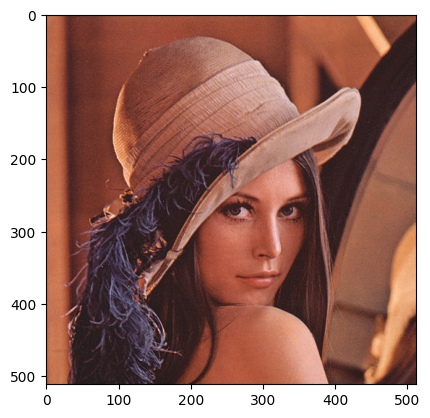

In [2]:
fname = 'lena.png'
original_image = Image.open(fname)
arr = np.asarray(original_image)
plt.imshow(arr)
plt.show()

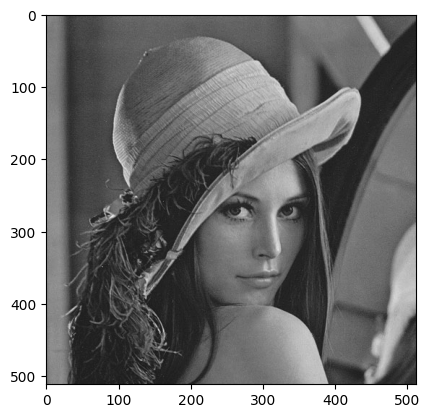

In [3]:
greyscale_image = Image.open(fname).convert("L")
arr = np.asarray(greyscale_image)
plt.imshow(arr, cmap='gray', vmin=0, vmax=255)
plt.show()

In [4]:
# 2D
def dct2(x):
    return spfft.dct(spfft.dct(x.T, norm='ortho', axis=0).T, norm='ortho', axis=0)

def idct2(x):
    return spfft.idct(spfft.idct(x.T, norm='ortho', axis=0).T, norm='ortho', axis=0)

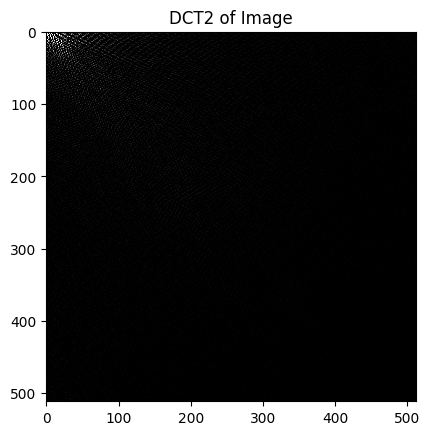

In [5]:
trasformed_image = dct2(arr)
plt.imshow(trasformed_image, cmap='gray', vmin=0, vmax=255)
plt.title('DCT2 of Image')
plt.show()

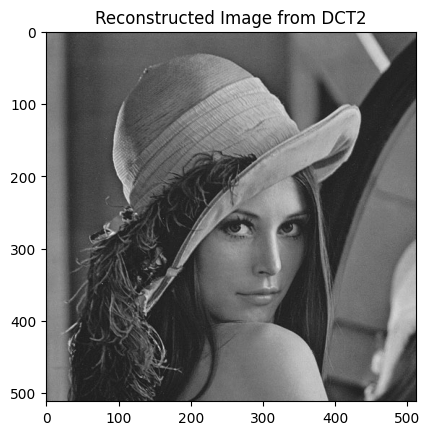

In [6]:
reconstructed_image = idct2(trasformed_image)
plt.imshow(reconstructed_image, cmap='gray', vmin=0, vmax=255)
plt.title('Reconstructed Image from DCT2')
plt.show()

In [7]:
def dct2_matrix(x):
    dct_matrix_rows = spfft.dct(np.identity(x.shape[0]), norm='ortho', axis=0)
    dct_matrix_cols = spfft.dct(np.identity(x.shape[1]), norm='ortho', axis=0)
    
    return dct_matrix_rows @ x @ dct_matrix_cols.T

def idct2_matrix(x):
    idct_matrix_rows = spfft.idct(np.identity(x.shape[0]), norm='ortho', axis=0)
    idct_matrix_cols = spfft.idct(np.identity(x.shape[1]), norm='ortho', axis=0)
    
    return idct_matrix_rows @ x @ idct_matrix_cols.T

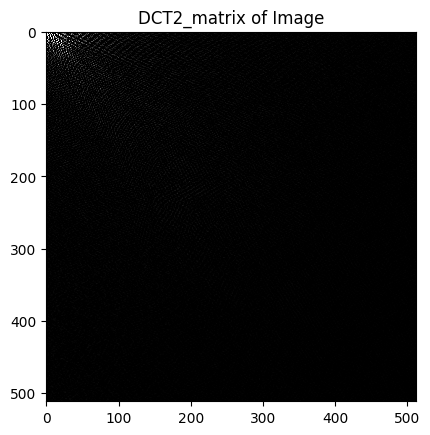

In [9]:
plt.imshow(dct_result_matrix, cmap='gray', vmin=0, vmax=255)
plt.title('DCT2_matrix of Image')
plt.show()

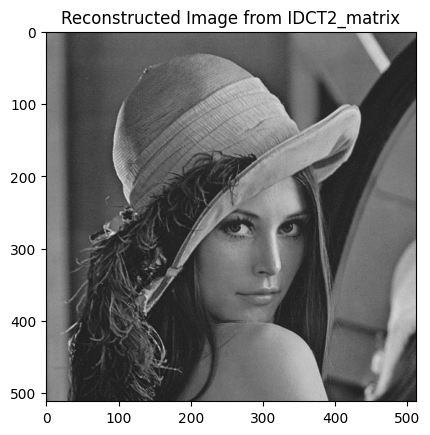

In [10]:
plt.imshow(idct_result_matrix, cmap='gray', vmin=0, vmax=255)
plt.title('Reconstructed Image from IDCT2_matrix')
plt.show()

In [8]:
# Compute DCT and IDCT using matrix multiplication
dct_result_matrix = dct2_matrix(arr)
idct_result_matrix = idct2_matrix(dct_result_matrix)

# Compute DCT and IDCT using the existing functions
dct_result_function = dct2(arr)
idct_result_function = idct2(dct_result_function)

# Verify the results
print(np.allclose(dct_result_matrix, dct_result_function))
print(np.allclose(idct_result_matrix, idct_result_function)) 

True
True


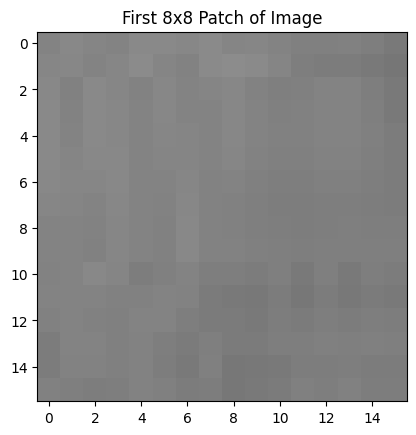

In [11]:
patch_size = 16 # either 8 or 16
first_patch = arr[0:patch_size, 0:patch_size]
nx, ny = first_patch.shape
plt.imshow(first_patch, cmap='gray', vmin=0, vmax=255)
plt.title('First 8x8 Patch of Image')
plt.show()

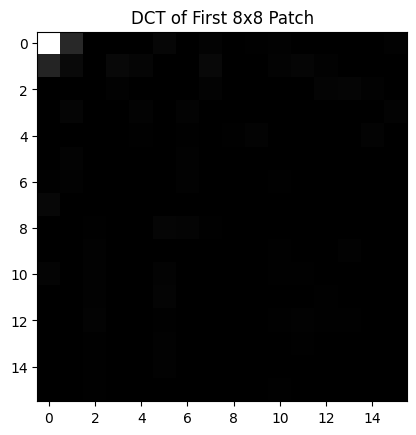

In [ ]:
first_patch_transformed = dct2(first_patch)
plt.imshow(first_patch_transformed, cmap='gray', vmin=0, vmax=255)
plt.title('DCT of First 8x8 Patch')
plt.show()

In [13]:
A = np.kron(
    spfft.idct(np.identity(first_patch.shape[0]), norm='ortho', axis=0),
    spfft.idct(np.identity(first_patch.shape[1]), norm='ortho', axis=0)
    )
print(A.shape)

(256, 256)


In [14]:
b = first_patch.T.flatten()
print(b.shape)

(256,)


In [15]:
# L1 optimization
vx = cvx.Variable(nx * ny)
objective = cvx.Minimize(cvx.norm(vx, 1))
constraints = [A@vx == b]
prob = cvx.Problem(objective, constraints)
result = prob.solve(verbose=True)
Xat2 = np.array(vx.value).squeeze()

                                     CVXPY                                     
                                     v1.6.4                                    
(CVXPY) Apr 08 03:33:29 PM: Your problem has 256 variables, 256 constraints, and 0 parameters.
(CVXPY) Apr 08 03:33:29 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Apr 08 03:33:29 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Apr 08 03:33:29 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Apr 08 03:33:29 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Apr 08 03:33:29 PM: Compiling problem (target solver=CLARABEL

In [19]:
X_at = Xat2.reshape(nx, ny).T # stack columns
Xa = idct2(Xat)

# confirm solution
print(np.allclose(Xa, first_patch))

True


In [17]:
err = ((first_patch - Xa)**2).mean()
print(err)

6.076185345246739e-25


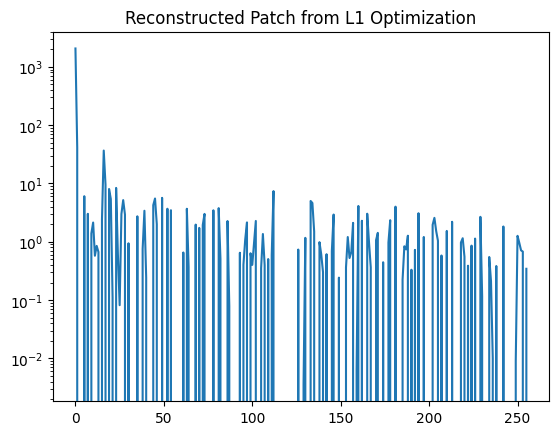

In [20]:
plt.plot(X_at.flatten())
plt.title('Reconstructed Patch from L1 Optimization')
plt.yscale('log')
plt.show()

In [22]:
sparsity = np.count_nonzero(X_at > 1e-3)
print(sparsity)

122


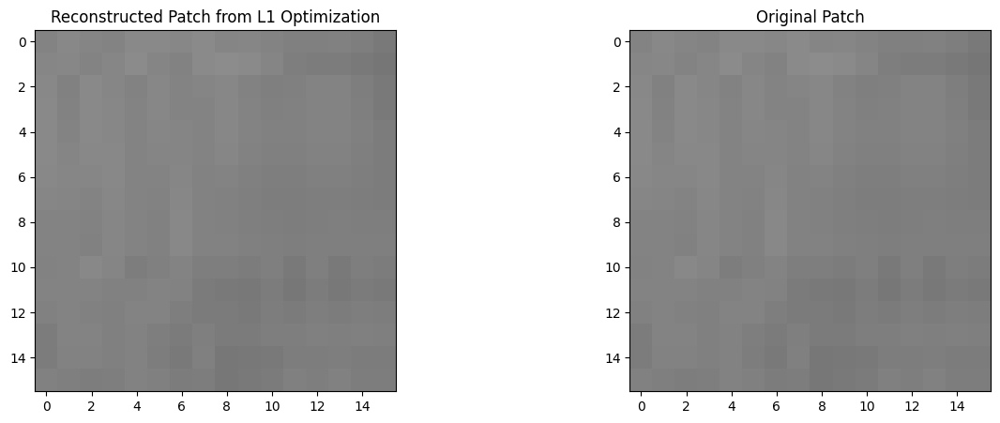

In [24]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.imshow(Xa, cmap='gray', vmin=0, vmax=255)
plt.title('Reconstructed Patch from L1 Optimization')
plt.subplot(1, 2, 2)
plt.imshow(first_patch, cmap='gray', vmin=0, vmax=255)
plt.title('Original Patch')
plt.show()

In [25]:
# parameters
N = arr.shape[0]
M = N // patch_size
patch_size = 16 # either 8 or 16
sample_percentages = [0.1, 0.2, 0.3, 0.4, 0.5]
sparsity_threshold = 1e-3
errors = np.zeros((M, M, len(sample_percentages)))
sparsities = np.zeros((M, M, len(sample_percentages)))
reconstructed_image = np.zeros((N, N, len(sample_percentages)))

In [26]:
# Iterate over patches(without overlap)
for k in range(len(sample_percentages)):
    for i in range(0, arr.shape[0], patch_size):
        for j in range(0, arr.shape[1], patch_size):
            patch = arr[i:i+patch_size, j:j+patch_size]
            nx, ny = patch.shape
            
            # subsampling
            m = round(nx * ny * sample_percentages[k])
            ri = np.random.choice(nx * ny, m, replace=False)

            patch_transformed = dct2(patch) # DCT of the patch

            A = np.kron(
                spfft.idct(np.identity(patch.shape[0]), norm='ortho', axis=0),
                spfft.idct(np.identity(patch.shape[1]), norm='ortho', axis=0)
            )
            A = A[ri, :] # subsampled

            b = patch.T.flatten()[ri] # subsampled

            vx = cvx.Variable(nx * ny)
            objective = cvx.Minimize(cvx.norm(vx, 1))
            constraints = [A@vx == b]
            prob = cvx.Problem(objective, constraints)
            result = prob.solve(verbose=False)
            Xat2 = np.array(vx.value).squeeze()

            Xat = Xat2.reshape(nx, ny).T # stack columns
            Xa = idct2(Xat)

            # Store the reconstructed patch in the result image
            err = ((patch - Xa)**2).mean()
            errors[i//patch_size, j//patch_size, k] = err

            sparsity = np.count_nonzero(Xat > sparsity_threshold)
            sparsities[i//patch_size, j//patch_size, k] = sparsity

            reconstructed_image[i:i+patch_size, j:j+patch_size, k] = Xa

In [27]:
np.save(os.path.join(os.getcwd(), 'results', 'reconstructed_image_2DCT.npy'), reconstructed_image)
np.save(os.path.join(os.getcwd(), 'results', 'errors_2DCT.npy'), errors)
np.save(os.path.join(os.getcwd(), 'results', 'sparsities_2DCT.npy'), sparsities)

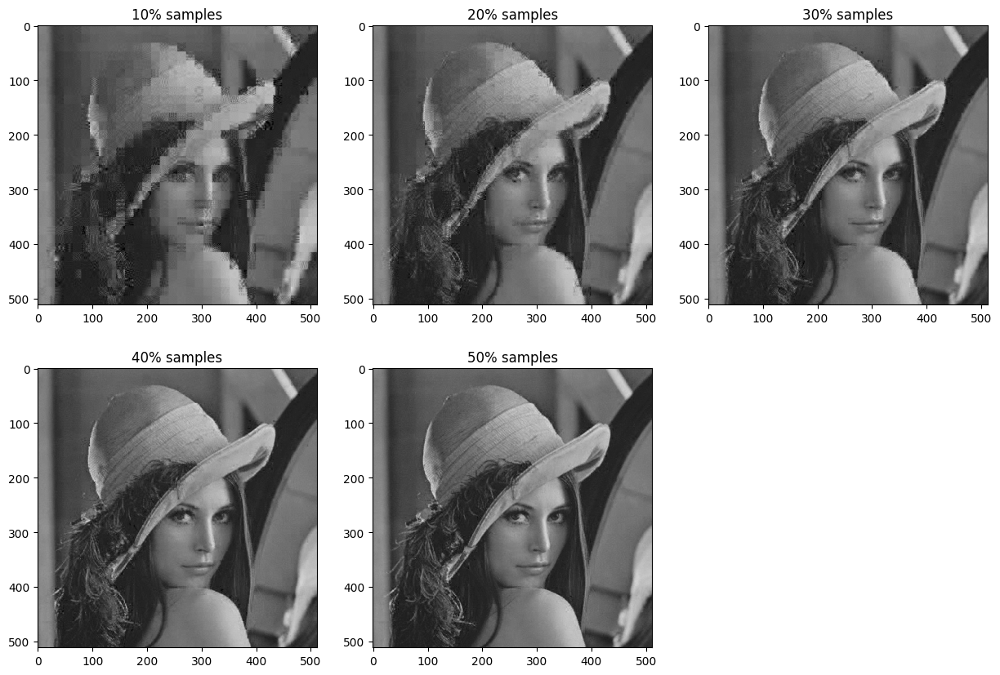

In [28]:
plt.figure(figsize=(15, 10))
plt.subplot(2, 3, 1)
plt.imshow(reconstructed_image[:, :, 0], cmap='gray', vmin=0, vmax=255)
plt.title(f'10% samples')
plt.subplot(2, 3, 2)
plt.imshow(reconstructed_image[:, :, 1], cmap='gray', vmin=0, vmax=255)
plt.title(f'20% samples')
plt.subplot(2, 3, 3)
plt.imshow(reconstructed_image[:, :, 2], cmap='gray', vmin=0, vmax=255)
plt.title(f'30% samples')
plt.subplot(2, 3, 4)
plt.imshow(reconstructed_image[:, :, 3], cmap='gray', vmin=0, vmax=255)
plt.title(f'40% samples')
plt.subplot(2, 3, 5)
plt.imshow(reconstructed_image[:, :, 4], cmap='gray', vmin=0, vmax=255)
plt.title(f'50% samples')
plt.show()

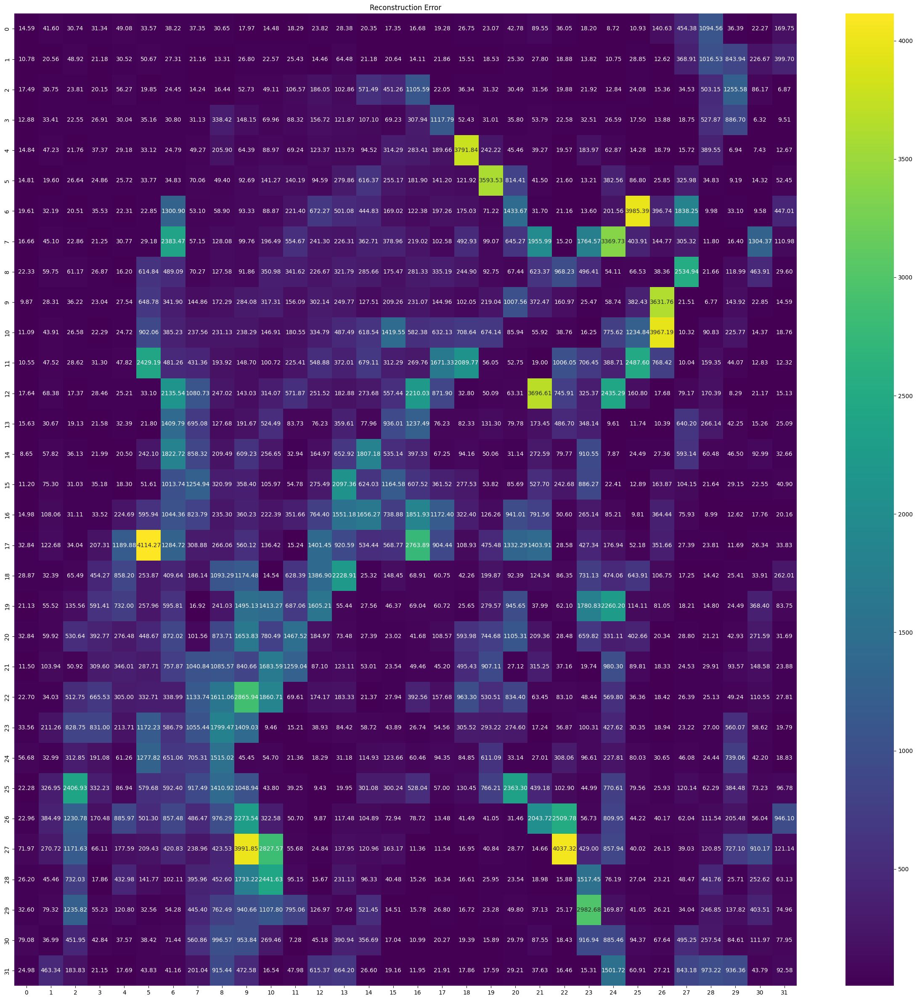

In [29]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(errors[:, :, 0], annot=True, fmt=".2f", cmap='viridis')
plt.show()

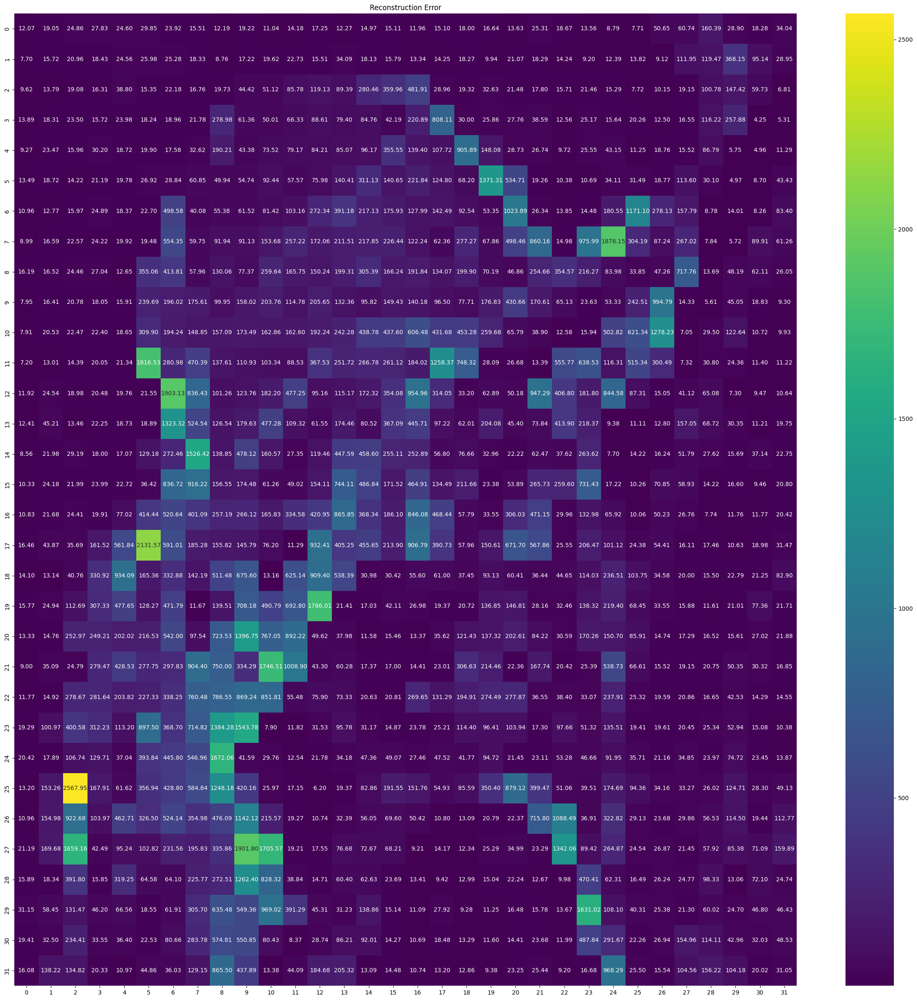

In [30]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(errors[:, :, 1], annot=True, fmt=".2f", cmap='viridis')
plt.show()

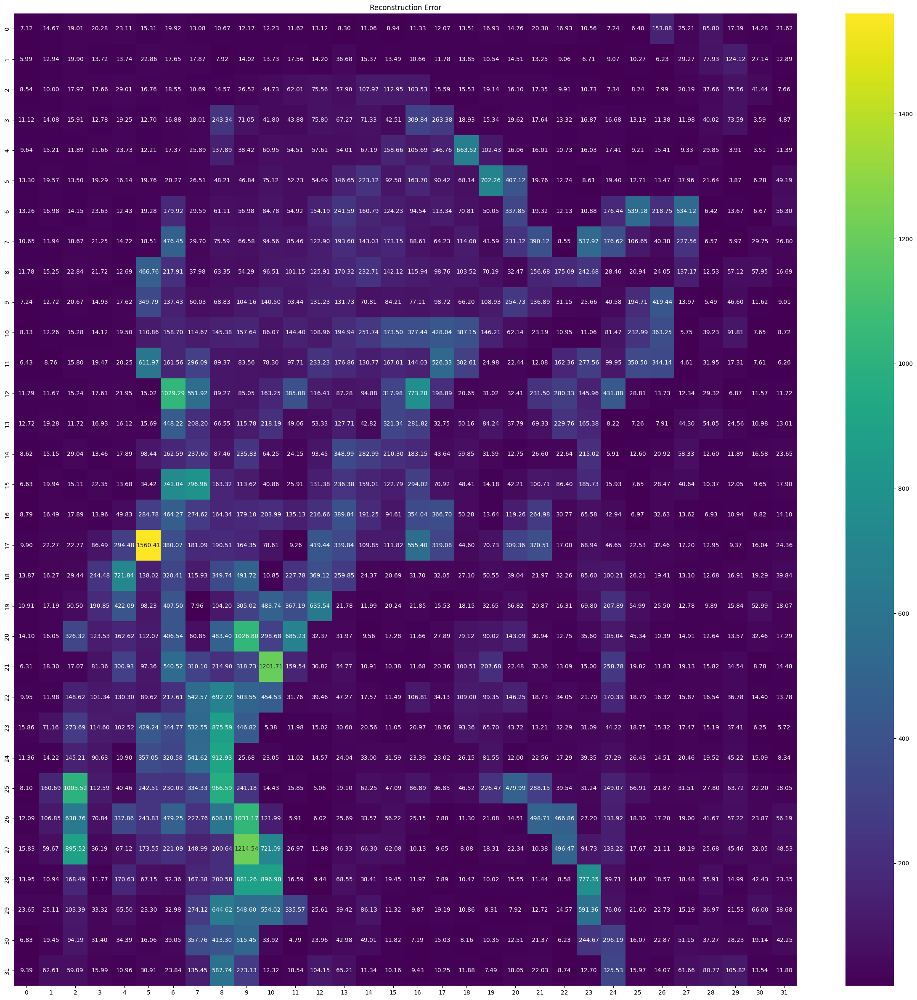

In [31]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(errors[:, :, 2], annot=True, fmt=".2f", cmap='viridis')
plt.show()

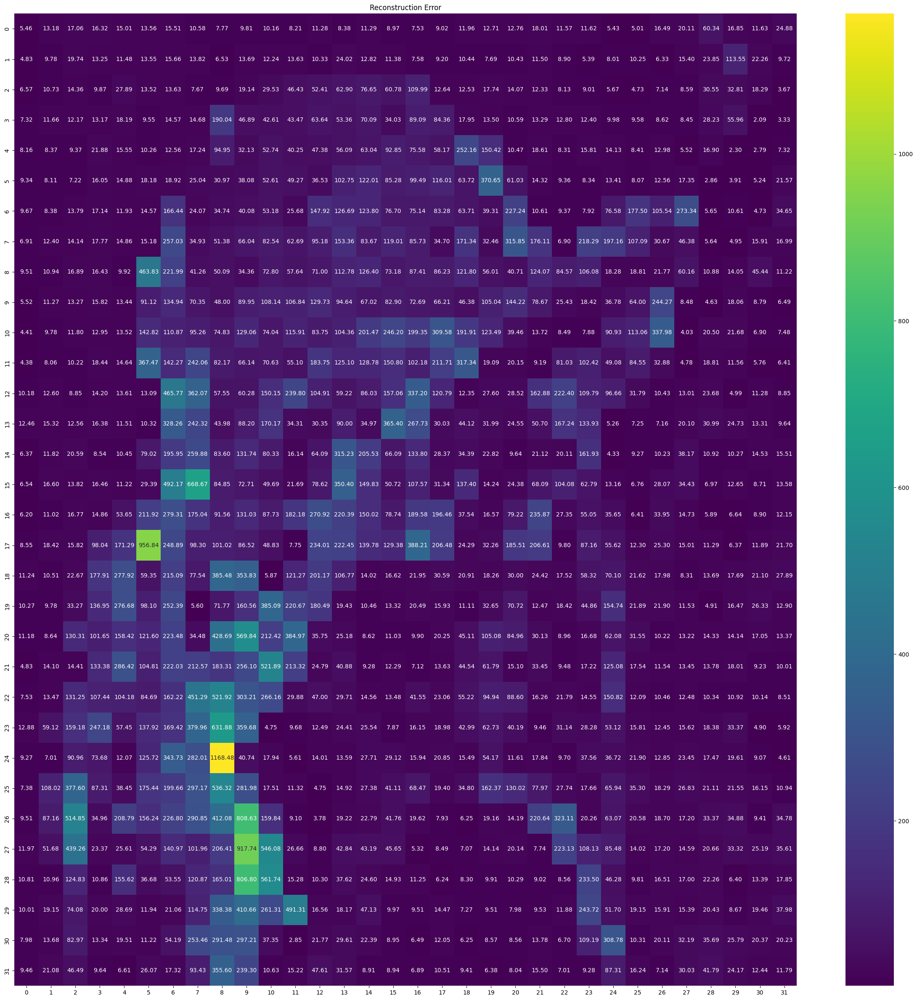

In [32]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(errors[:, :, 3], annot=True, fmt=".2f", cmap='viridis')
plt.show()

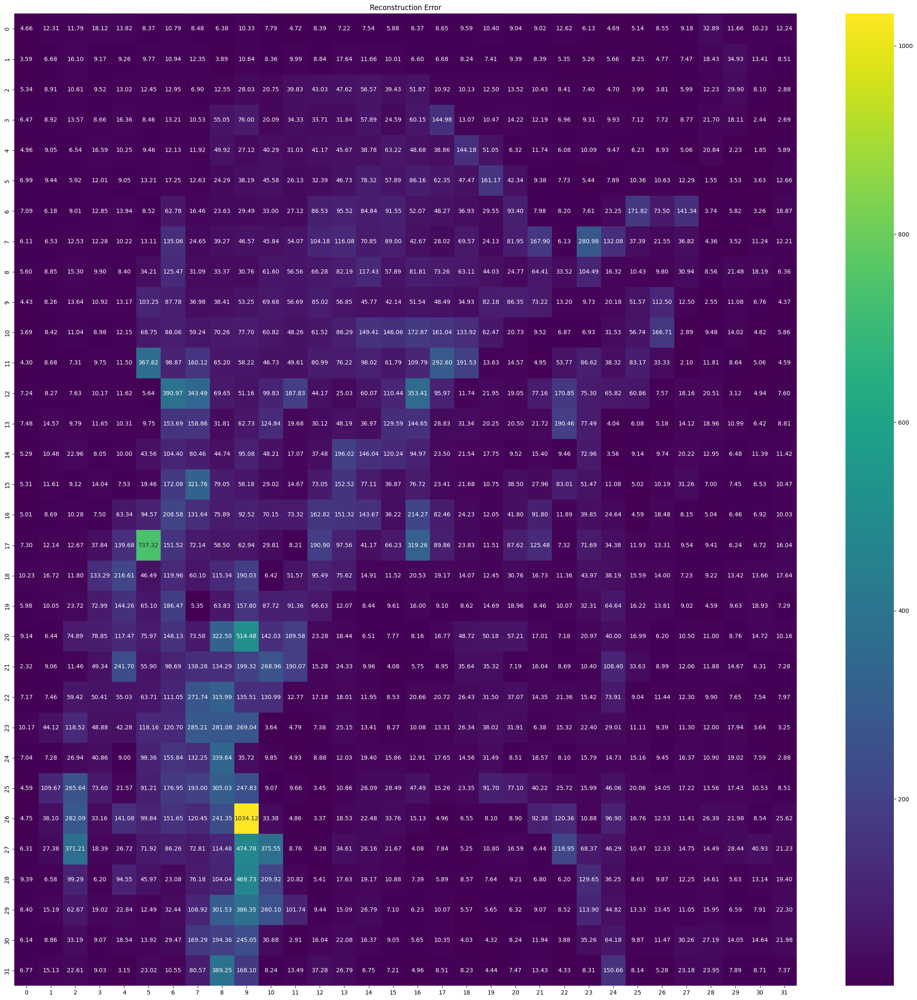

In [33]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(errors[:, :, 4], annot=True, fmt=".2f", cmap='viridis')
plt.show()

In [34]:
print(np.mean(sparsities[:, :, 0]))
print(np.mean(sparsities[:, :, 1]))
print(np.mean(sparsities[:, :, 2]))
print(np.mean(sparsities[:, :, 3]))
print(np.mean(sparsities[:, :, 4]))

13.53125
25.986328125
38.7939453125
51.3359375
64.607421875


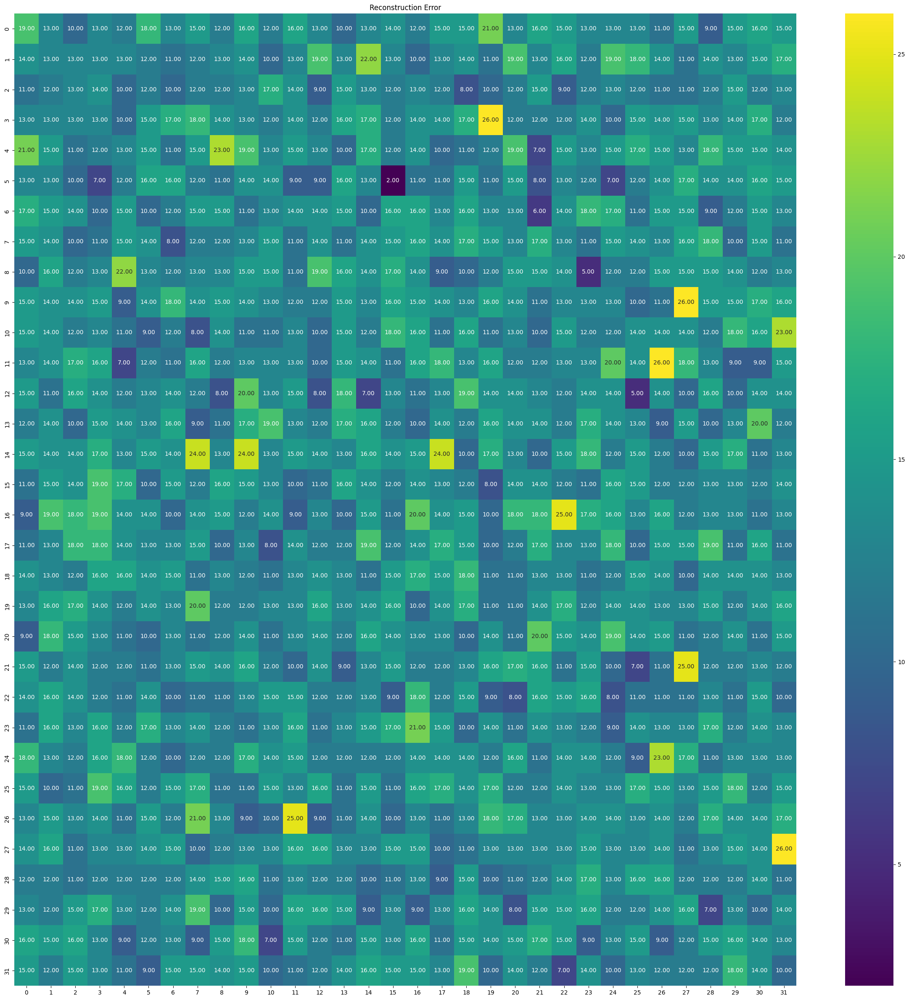

In [35]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(sparsities[:, :, 0], annot=True, fmt=".2f", cmap='viridis')
plt.show()

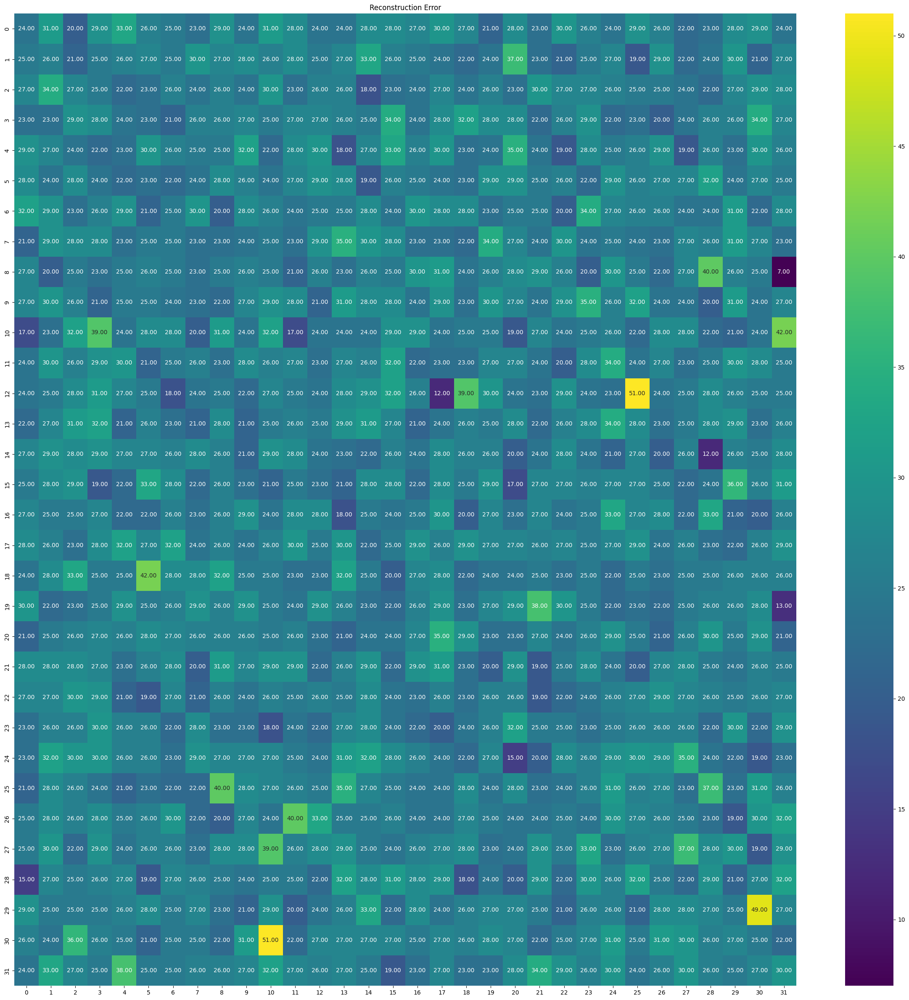

In [36]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(sparsities[:, :, 1], annot=True, fmt=".2f", cmap='viridis')
plt.show()

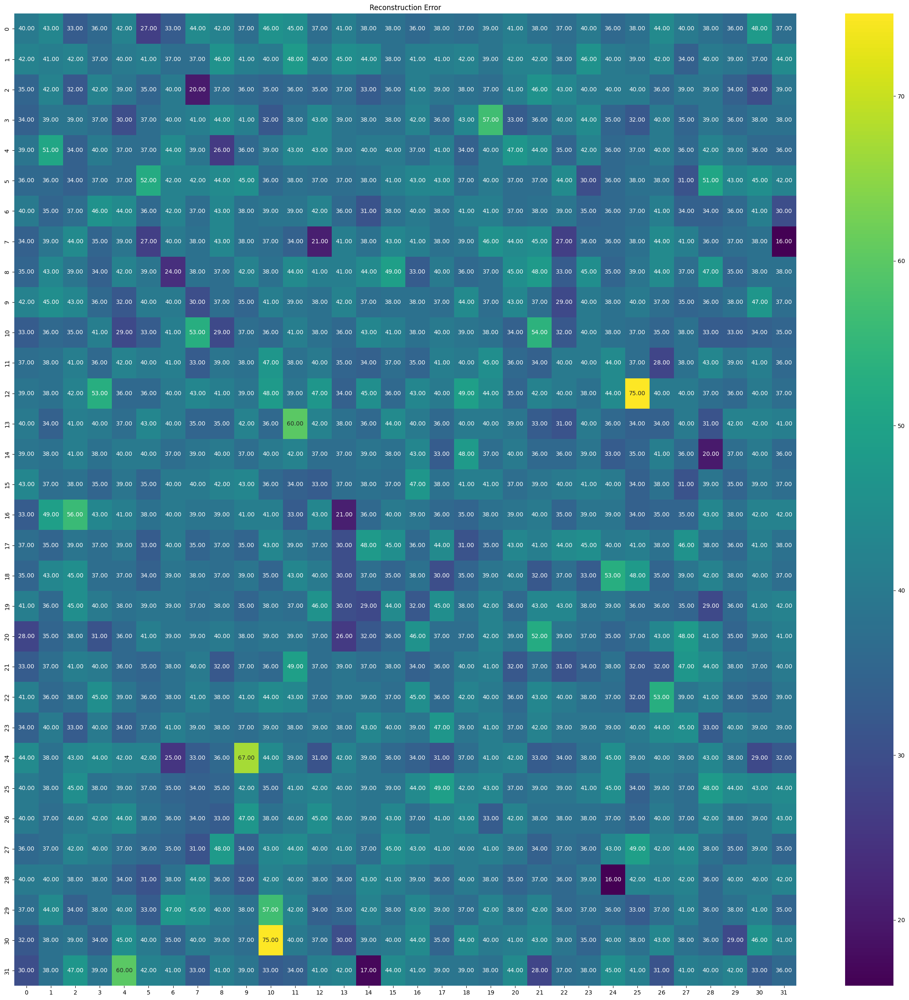

In [37]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(sparsities[:, :, 2], annot=True, fmt=".2f", cmap='viridis')
plt.show()

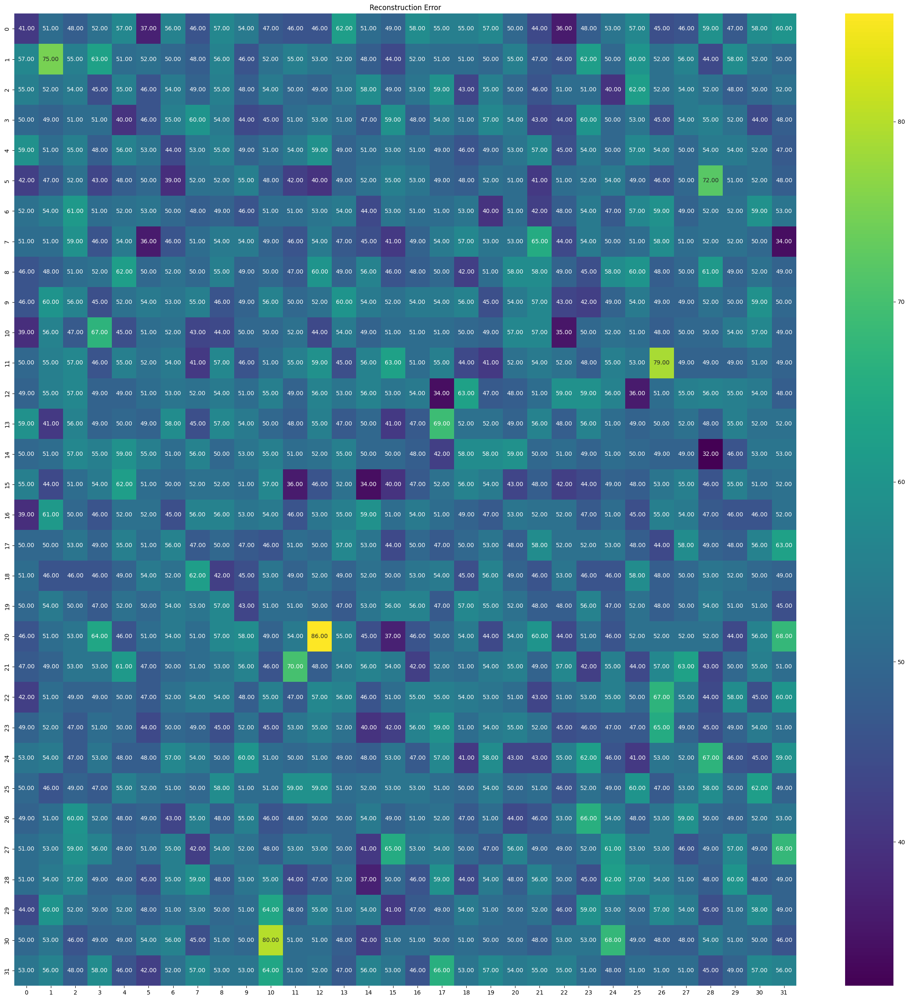

In [38]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(sparsities[:, :, 3], annot=True, fmt=".2f", cmap='viridis')
plt.show()

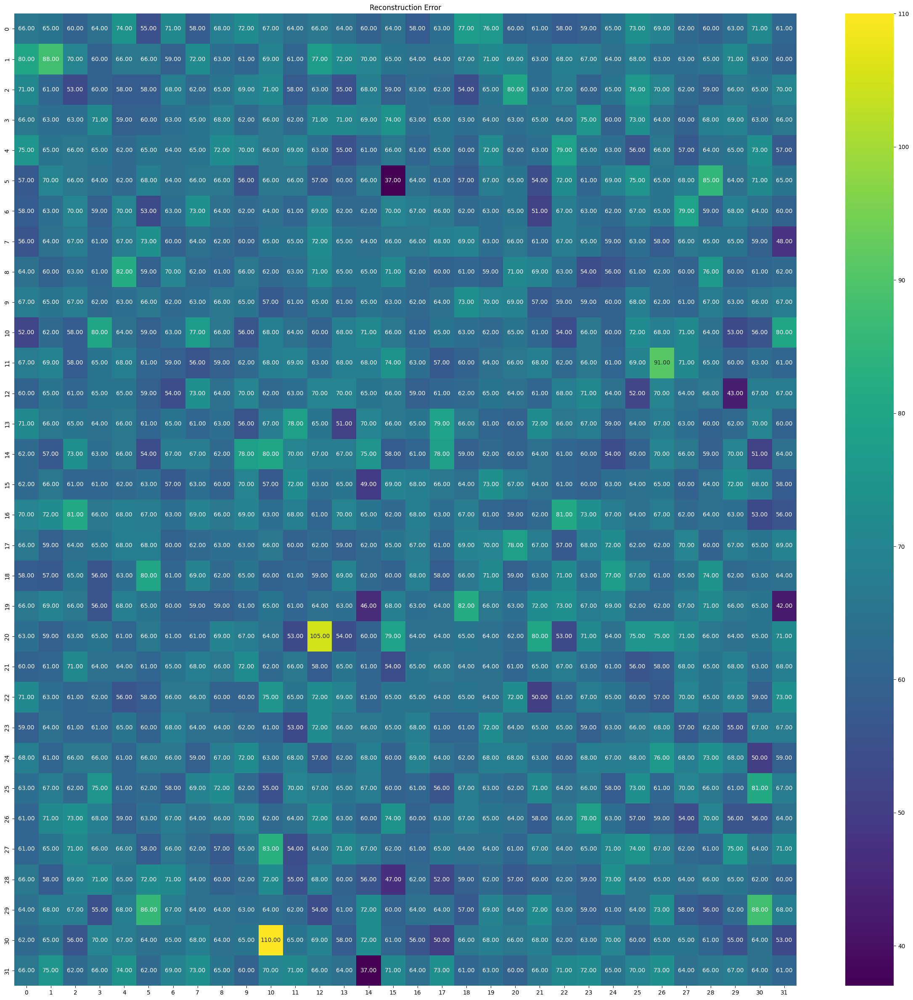

In [39]:
plt.figure(figsize=(30, 30))
plt.xlabel('Image Row')
plt.ylabel('Sample Percentage')
plt.title('Reconstruction Error')
sns.heatmap(sparsities[:, :, 4], annot=True, fmt=".2f", cmap='viridis')
plt.show()